In [1]:
import warnings
warnings.filterwarnings('ignore')

import os
import mne
import scipy
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.signal import butter
from scipy.signal import lfilter
from tqdm.notebook import tqdm
from collections import defaultdict
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from scipy.stats import combine_pvalues
from  mne.stats import fdr_correction as fdr_correction

DATA_DIR = '../data/eeg'
RESULT_DIR = 'signal_result'

NCOND = 4

# Z-score estimation

In [2]:
def get_zmatrix(data, event_names):
    """
    Calculates z-score matrix to estimate ERP difference between conditions
    :param data: ERP epoched data
    :param event_names: dict of event names
    :return x: filtered ERP data for conditions
    :return z: - z-score matrix
    :return Nt: Number of times per conditions
    :return Nc: Number of conditions
    """
    [b,a] = butter(3,0.01)
    x = []

    for cond in range(NCOND):
        cur_cond_data = data[event_names[cond]].get_data()
        x_cur = np.zeros((cur_cond_data.shape[0], 
                          cur_cond_data.shape[1], 
                          301))
        for i in range(cur_cond_data.shape[0]):
            tmp = lfilter(b, a, np.squeeze(cur_cond_data[i]))
            x_cur[i] = tmp[:, 0:tmp.shape[1]:4]
        x.append(x_cur)

    Nc = len(x)

    mx = []
    sx = []
    Nt = []

    for cond in range(NCOND):
        mx.append(np.squeeze(np.mean(x[cond], axis=0)))
        sx.append(np.squeeze(np.std(x[cond], axis=0)))
        Nt.append(cur_cond_data.shape[0])

    z = np.zeros((Nc, Nc, x[0].shape[1], x[0].shape[2]))

    for cond1 in list(range(Nc)):
        for cond2 in list(range(cond1+1, Nc)):
            tmp = (mx[cond2] - mx[cond1]) / np.sqrt((1 / Nt[cond1] * np.square(sx[cond1]) + 
                             1 / Nt[cond2] * np.square(sx[cond2])) / 2)
            z[cond1, cond2] = tmp
            z[cond2, cond1] = -tmp
            
    return z, x, Nt, Nc

def permutation_test(x, z, Nt, Nc):
    """
    Computes permutation test to estimate statistical significance of z-score estimation
    :param x: ERP data
    :param z: z-score matrix
    :param Nt: Number of times per conditions
    :param Nc: Number of conditions
    :return: matrix with p-values
    """
    random_seed = 0
    p = np.zeros((Nc, Nc, z.shape[2], z.shape[3]))

    for cond1 in range(Nc):
        for cond2 in range(cond1+1, Nc):
            data12 = np.concatenate((x[cond1], x[cond2]))
            N = Nt[cond1] + Nt[cond2]
            N1 = Nt[cond1]
            N2 = Nt[cond2]
            zs = np.zeros((100, 
                           x[cond1].shape[1],
                          x[cond1].shape[2]))
            for bs in range(100):
                try:
                    np.random.seed(random_seed)                
                    i1 = np.fix(np.random.rand(1, N1) * (N-1))[0].astype(int)
                    random_seed += 1
                    np.random.seed(random_seed)               
                    i2 = np.fix(np.random.rand(1, N2) * (N-1))[0].astype(int)
                    i1 = np.where(i1 >= data12.shape[0], np.random.choice(np.arange(data12.shape[0]), 1), i1)
                    i2 = np.where(i2 >= data12.shape[0], np.random.choice(np.arange(data12.shape[0]), 1), i2)
                    random_seed += 1
                    mx1s = np.squeeze(np.mean(data12[i1, :, :], axis=0))
                    mx2s = np.squeeze(np.mean(data12[i2, :, :], axis=0))
                    sx1s = np.squeeze(np.std(data12[i1, :, :], axis=0))
                    sx2s = np.squeeze(np.std(data12[i2, :, :], axis=0))
                    zs[bs, :, :] = (mx2s - mx1s) / np.sqrt(
                    (1 / N1 * np.square(sx1s) + 1 / N2 * np.square(sx2s)) / 2 )
                except Exception as e:
                    print(e)

            for i in range(zs.shape[1]):
                for j in range(zs.shape[2]):
                    p[cond1, cond2, i, j] = np.sum(zs[:, i, j] > z[cond1, cond2, i, j]) / zs[:, i, j].shape[0]
                    p[cond2, cond1, i, j] = np.sum(zs[:, i, j] < z[cond1, cond2, i, j]) / zs[:, i, j].shape[0]
    return p

# Vizualization

In [ ]:
def plot_permutation_test(p=None, cond_dict=None, Nc=12, show = False, folder = '.', 
                          alpha=0.05, postfix=None, fontsize=35, example_data=None):
    """
    Plots p-values matrix of permutation test
    :param p: permutation matrix with p-values
    :param cond_dict: dictionary of condition names
    :param show: flag to show plot or not
    :param folder: folder name for saving
    :param alpha: significance level
    :param postfix: postfix of the plot file name
    :param fontsize: size of font
    :param example_data: EEG data with information about electrodes montage
    """
    %matplotlib inline
    fig, axes= plt.subplots(Nc, Nc, figsize=(30, 30))
    for c1 in range(Nc):
        for c2 in range(Nc):
            if c1 == c2:
                continue
            pvals = axes[c1, c2].imshow(p[c1, c2] < alpha, 
                                          aspect='auto')
            fig.colorbar(pvals, ax=axes[c1, c2])
            axes[c1, c2].set_title( f'{cond_dict[c1]} VS {cond_dict[c2]}', fontsize = fontsize)#35)
            axes[c1, c2].set_xlabel('Time, ms')
            axes[c1, c2].set_ylabel('Channels')
            axes[c1, c2].set_xticks(np.arange(0, 301, 25), labels=np.arange(-400, 802, 100))
            axes[c1, c2].set_yticks(np.arange(0, 63), labels=example_data.ch_names)
    fig.tight_layout()
    if show:
        fig.show()
    if postfix is None:
        fig.savefig(os.path.join(folder, f'mean_pvals.pdf'))
    else:
        fig.savefig(os.path.join(folder, f'mean_pvals_{postfix}.pdf'))

def plot_zmatrix(z=None, Nc=12, cond_dict=None, show=False, folder = None, 
                 postfix=None, fontsize=35, example_data=None):
    """
    Plots z-score matrix
    :param z: z-score values matrix
    :param cond_dict: dictionary of condition names
    :param show: flag to show plot or not
    :param folder: folder name for saving
    :param postfix: postfix of the plot file name
    :param fontsize: size of font
    :param example_data: EEG data with information about electrodes montage
    """
    fig, axes= plt.subplots(Nc, Nc, figsize=(30, 30))
    for c1 in range(Nc):
        for c2 in range(Nc):
            if c1 == c2:
                continue
            bounds = np.arange(-1, 1, 0.2)
            norm = colors.BoundaryNorm(boundaries=bounds, ncolors=256)
            zscores = axes[c1, c2].imshow(z[c1, c2],
                                          extent=[0, z[c1, c2].shape[1], z[c1, c2].shape[0], 0], 
                                          aspect='auto', norm=norm)
            fig.colorbar(zscores, ax=axes[c1, c2])
            axes[c1, c2].set_title( f'{cond_dict[c1]} VS {cond_dict[c2]}', fontsize=fontsize) #35)
            axes[c1, c2].set_ylabel('Channels')
            axes[c1, c2].set_xticks(np.arange(0, 301, 25), labels=np.arange(-400, 802, 100))
            axes[c1, c2].set_yticks(np.arange(0, 63), labels=example_data.ch_names)
            axes[c1, c2].set_xlabel('Time, ms')
    fig.tight_layout()
    if show:
        fig.show()
    if folder is not None:
        if postfix is None:
            fig.savefig(os.path.join(folder, f'mean_z-scores.pdf'))
        else: fig.savefig(os.path.join(folder, f'mean_z-scores_{postfix}.pdf'))

def plot_topo(zmatrix, example_data, cond_dict, folder, Nc=6,fontsize=30, order = 'Congr-Incongr'):
    """
    Plots topograpy of z-score matrix
    :param zmatrix: z-score values matrix
    :param cond_dict: dictionary of condition names
    :param folder: folder name for saving
    :param postfix: postfix of the plot file name
    :param fontsize: size of font
    :param example_data: EEG data with information about electrodes montage
    :param order:  direction of condition comparison
    :param Nc: number of subplots
    """
    fig = plt.figure(layout='constrained', figsize=(30, 30))
    subfigs = fig.subfigures(Nc, 1, wspace=0.02,)
    condition_pairs = []
    counter = 0
    for c1 in range(NCOND):
        for c2 in range(c1, NCOND):
            if c1 == c2:
                continue
            axs = subfigs[counter].subplots(1, 10, gridspec_kw=dict(width_ratios=[2, 2, 2, 2, 2, 2, 2, 2, 2, 0.5]))
            if order == 'Congr-Incongr':
                title = f'{cond_dict[c1]} VS {cond_dict[c2]}'
                f_evoked = mne.EvokedArray(np.repeat(zmatrix[c1, c2][:,100:], 4, axis=1), example_data.info, tmin=-0.)
            else:
                title = f'{cond_dict[c2]} VS {cond_dict[c1]}'
                f_evoked = mne.EvokedArray(np.repeat(zmatrix[c2, c1][:,100:], 4, axis=1), example_data.info, tmin=-0.)
            condition_pairs.append(title)
            f_evoked.plot_topomap(times=np.arange(-0., 0.801, 0.1), axes = axs, show=False, contours=0)
            subfigs[counter].suptitle(title, fontsize=45, fontname='Times New Roman')
            for ax in axs[1::2]:
                ax.set_title('')
            for ax, title_ in list(zip(axs, [f"{int(time)} ms" for time in range(0,802,100)]))[::2]:
                if '-0.0' in ax.get_title():
                    ax.set_title('0 ms', fontsize=fontsize, fontname='Times New Roman')
                else:
                    ax.set_title(title_, fontsize=fontsize, fontname='Times New Roman')
            counter += 1
    plt.show()
    fig.savefig(os.path.join(folder, f'topoplot_{order.lower()}.pdf'))

## Z-matrix compuitation and permutation tests
- Compute z-score matrix for each participant and estimate its significance with permutation test

In [4]:
if not os.path.exists(RESULT_DIR):
    os.mkdir(RESULT_DIR)

for folder in ['4x4', 'priming_effect', 'ERP', 'ERP_difference',
              'permutation_results_4x4']:
    res_folder = os.path.join(RESULT_DIR, folder)
    if not os.path.exists(res_folder):
        os.mkdir(res_folder)

In [6]:
NCOND = 4

# %matplotlib inline
for p_ID in tqdm(range(21)):
    perm_dir = os.path.join(RESULT_DIR, 'permutation_results_4x4')
    epochs = mne.read_epochs(os.path.join(DATA_DIR, f'p{p_ID}_epochs.fif'), verbose='ERROR')
    epochs.set_eeg_reference(projection=False, verbose='ERROR')
    event_names = [['Stimulus/S  1_1', 'Stimulus/S  1_2', 'Stimulus/S  1_3'],
                   ['Stimulus/S  2_1', 'Stimulus/S  2_2', 'Stimulus/S  2_3'],
                   ['Stimulus/S  3_1', 'Stimulus/S  3_2', 'Stimulus/S  3_3'],
                   ['Stimulus/S  4_1', 'Stimulus/S  4_2', 'Stimulus/S  4_3']]
    z, x, Nt, Nc = get_zmatrix(epochs, event_names)
    # print('Z matrix saved')
    p = permutation_test(x, z, Nt, Nc)
    # print('Permutations done')
    results = {'z': z, 'x': x, 'Nt': Nt, 'p': p}
    fname = os.path.join(perm_dir, f'p{p_ID}_results_permutations_reference_averaged.npy')
    with open(fname, 'wb') as f:
        np.save(f, results)
    # print('Permutations saved')

  0%|          | 0/21 [00:00<?, ?it/s]

- Read z-scores and p-values matrices of all participants into one array 

In [7]:
example_data = mne.read_epochs(os.path.join(DATA_DIR, 'p0_epochs.fif'), verbose='ERROR')
dataset_p = []
dataset_z = []
for p_ID in range(21):
    perm_dir = os.path.join(RESULT_DIR, f'permutation_results_4x4')
    data = np.load(os.path.join(perm_dir, f'p{p_ID}_results_permutations_reference_averaged.npy'), allow_pickle=True).item()
    dataset_p.append(data['p'])
    dataset_z.append(data['z'])

dataset_p = np.array(dataset_p)
dataset_z = np.array(dataset_z)
dataset_z_mean = dataset_z.mean(axis=0)

NChannels = dataset_p.shape[3]
NTimes = dataset_p.shape[4]

- Average z-scores and p-values across participants

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

0.02281756828950737


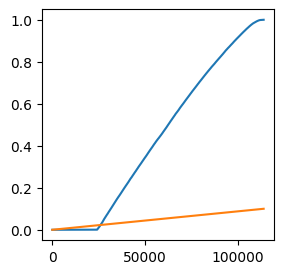

In [8]:
p_values_mean = np.zeros((NCOND, NCOND, NChannels, NTimes))

for cond1 in tqdm(range(NCOND)):
    for cond2 in range(NCOND):
        for channel in range(NChannels):
            for timestamp in range(NTimes):
                p_values_mean[cond1, cond2, channel, timestamp] = combine_pvalues(
                    dataset_p[:, cond1, cond2, channel, timestamp])[1]

p_values_mean_flat = []

for cond1 in tqdm(range(NCOND)):
    for cond2 in range(cond1 + 1, NCOND):
        p_values_mean_flat.append(p_values_mean[cond1, cond2, :, :])
        
a = np.array(p_values_mean_flat).flatten()
a.sort()
b = (np.arange(a.shape[0]) / a.shape[0]) * 0.1

for i in range(a.shape[0]):
    if a[i] > b[i]:
        corrected_p = a[i]
        break
print(corrected_p)
fig, axes = plt.subplots(1, 1, figsize=(3,3))

axes.plot(a)
axes.plot(b)
plt.show()

- Visualize z-matrices, p-values, and topographies

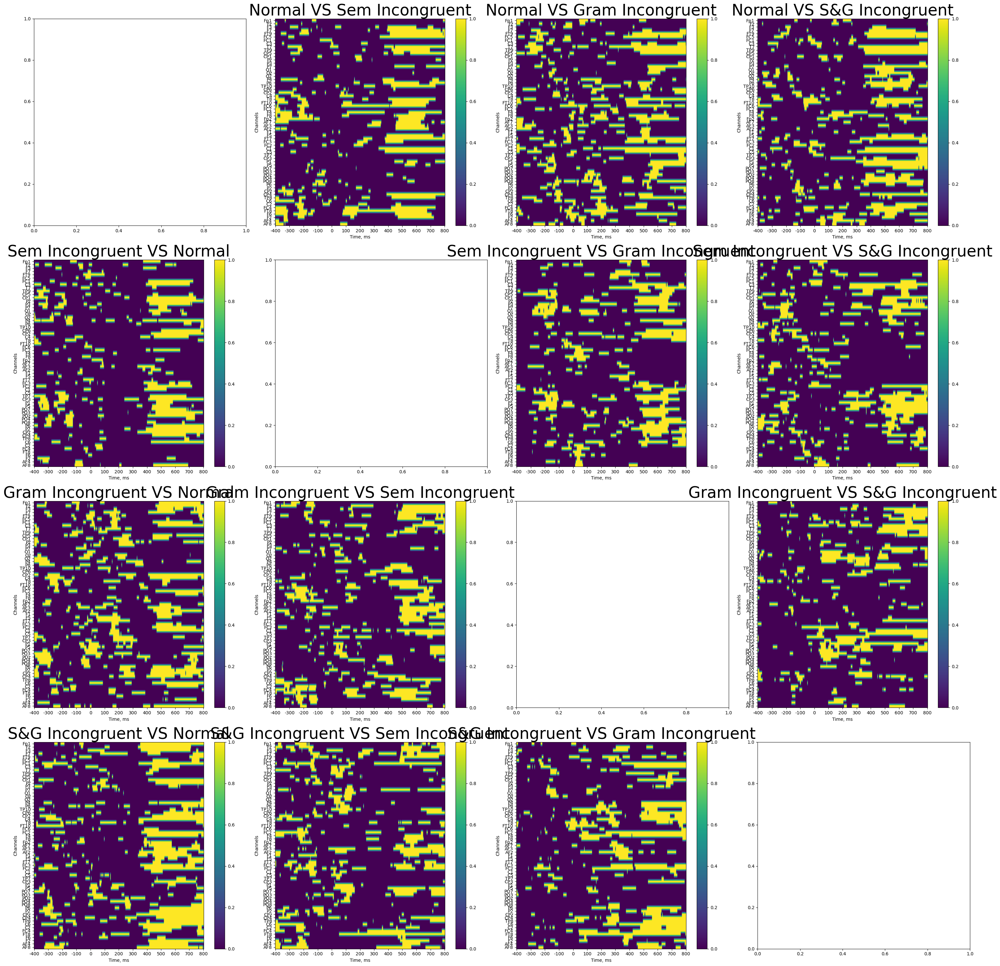

In [ ]:
cond_dict = ['Normal', 'Sem Incongruent', 'Gram Incongruent', 'S&G Incongruent']

plot_permutation_test(p_values_mean, cond_dict=cond_dict, folder=os.path.join(RESULT_DIR, '4x4'), 
                      Nc = 4, alpha=corrected_p, postfix='fdr_corrected', example_data=example_data)

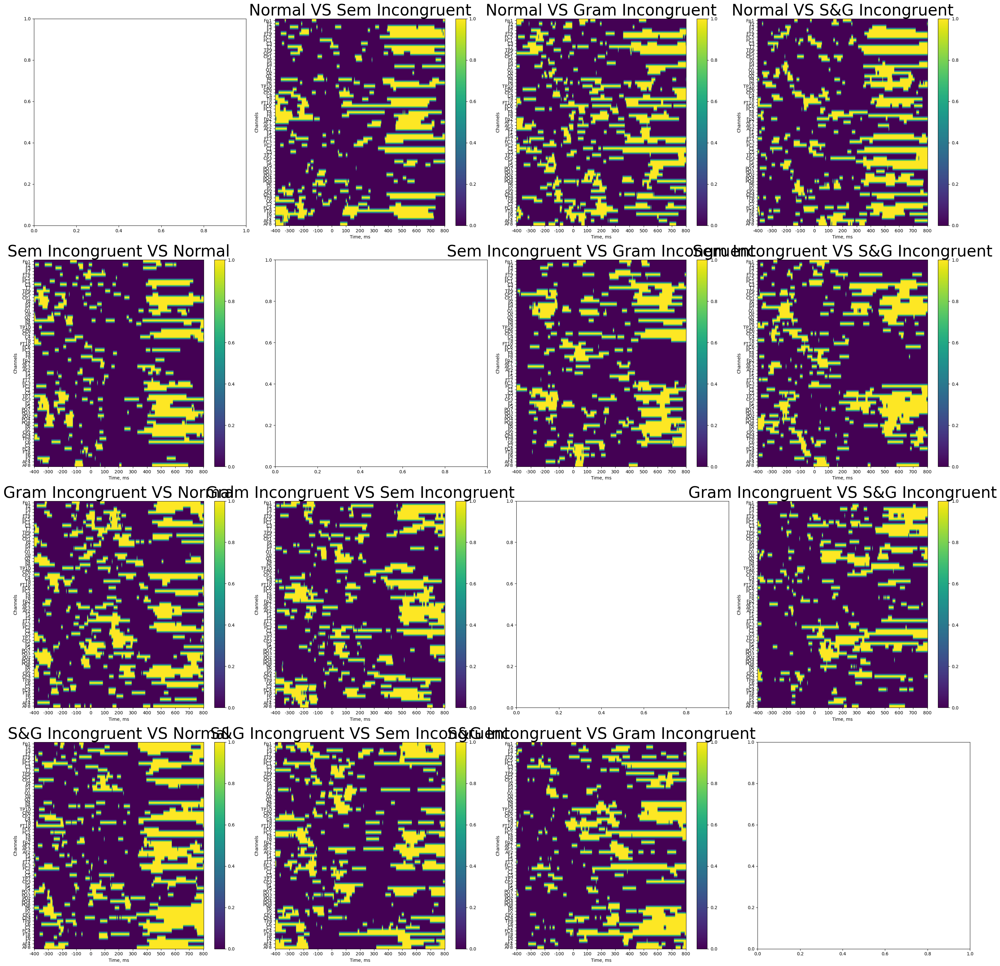

In [ ]:
plot_permutation_test(p_values_mean, cond_dict=cond_dict, folder=os.path.join(RESULT_DIR, '4x4'), 
                      Nc = 4, alpha=0.05, example_data=example_data)

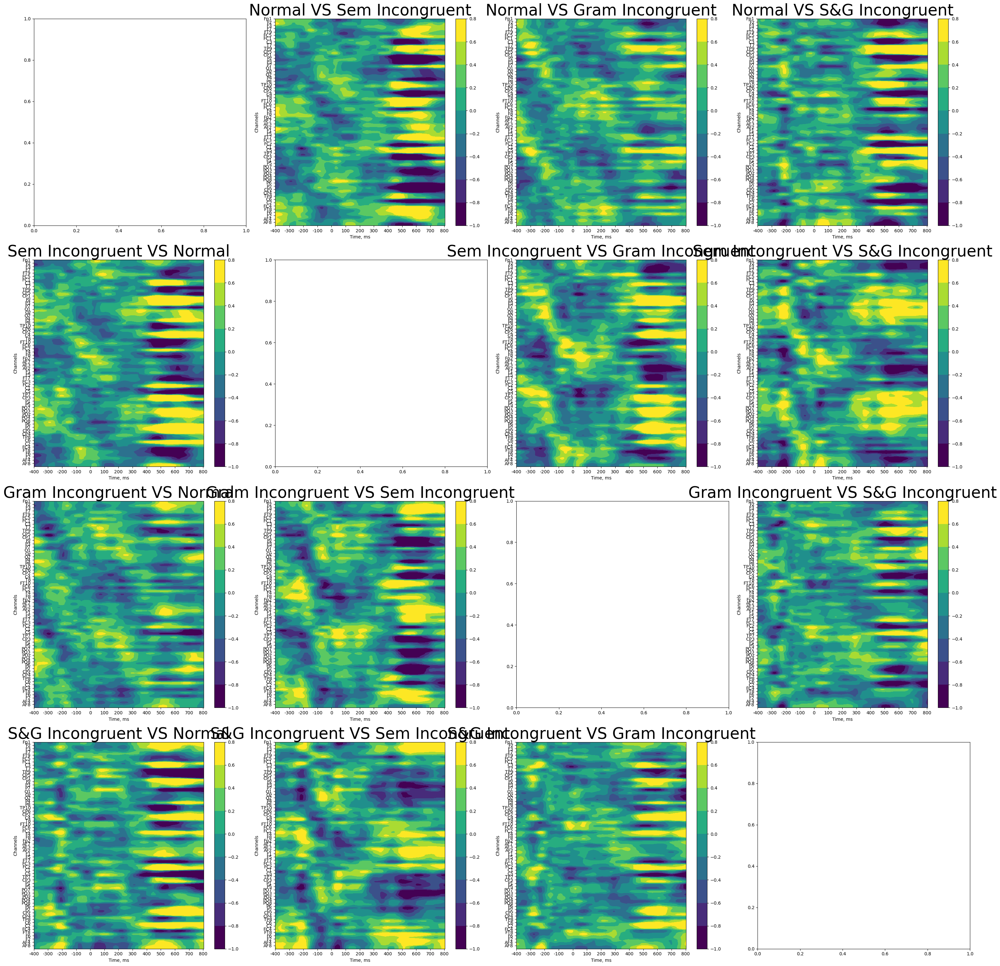

In [11]:
plot_zmatrix(dataset_z_mean, cond_dict = cond_dict, folder=os.path.join(RESULT_DIR, '4x4'), Nc=4, example_data=example_data)

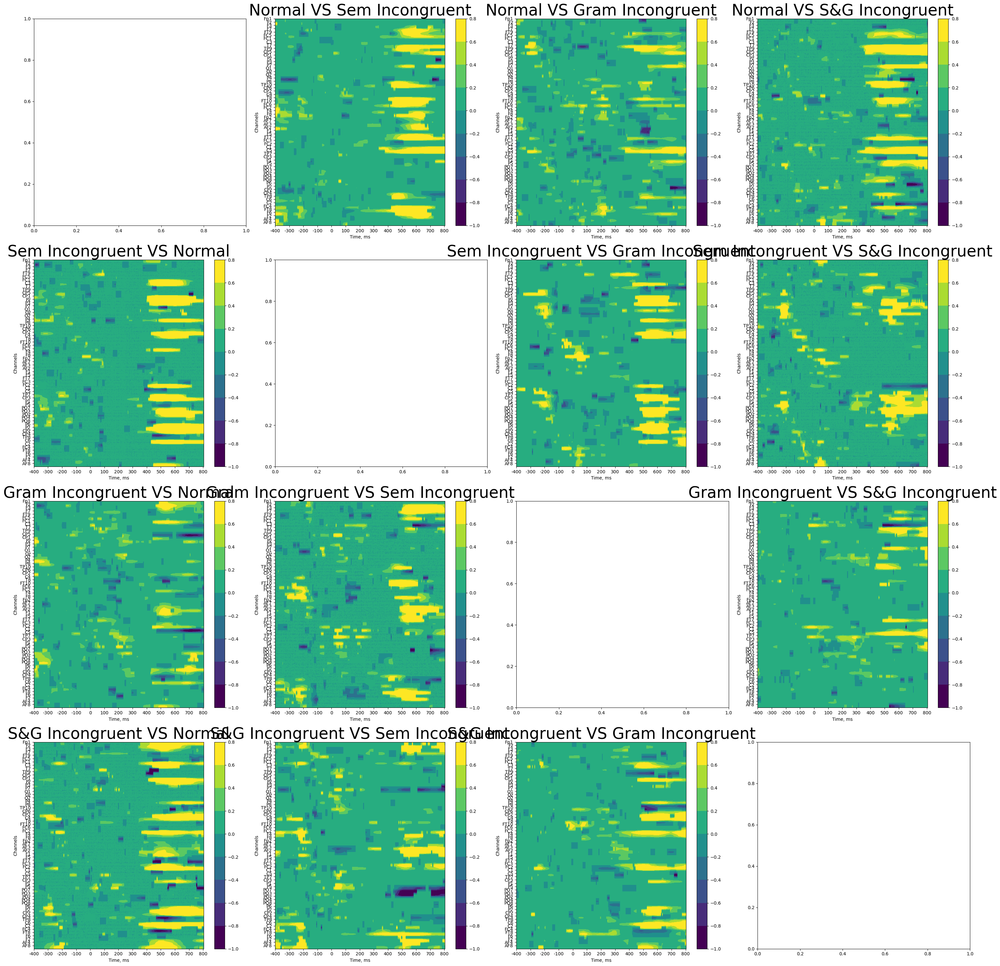

In [12]:
data_masked = np.where(p_values_mean <= corrected_p, dataset_z_mean, 0)
plot_zmatrix(data_masked, Nc=4, cond_dict=cond_dict, folder=os.path.join(RESULT_DIR, '4x4'), postfix='masked', example_data=example_data)

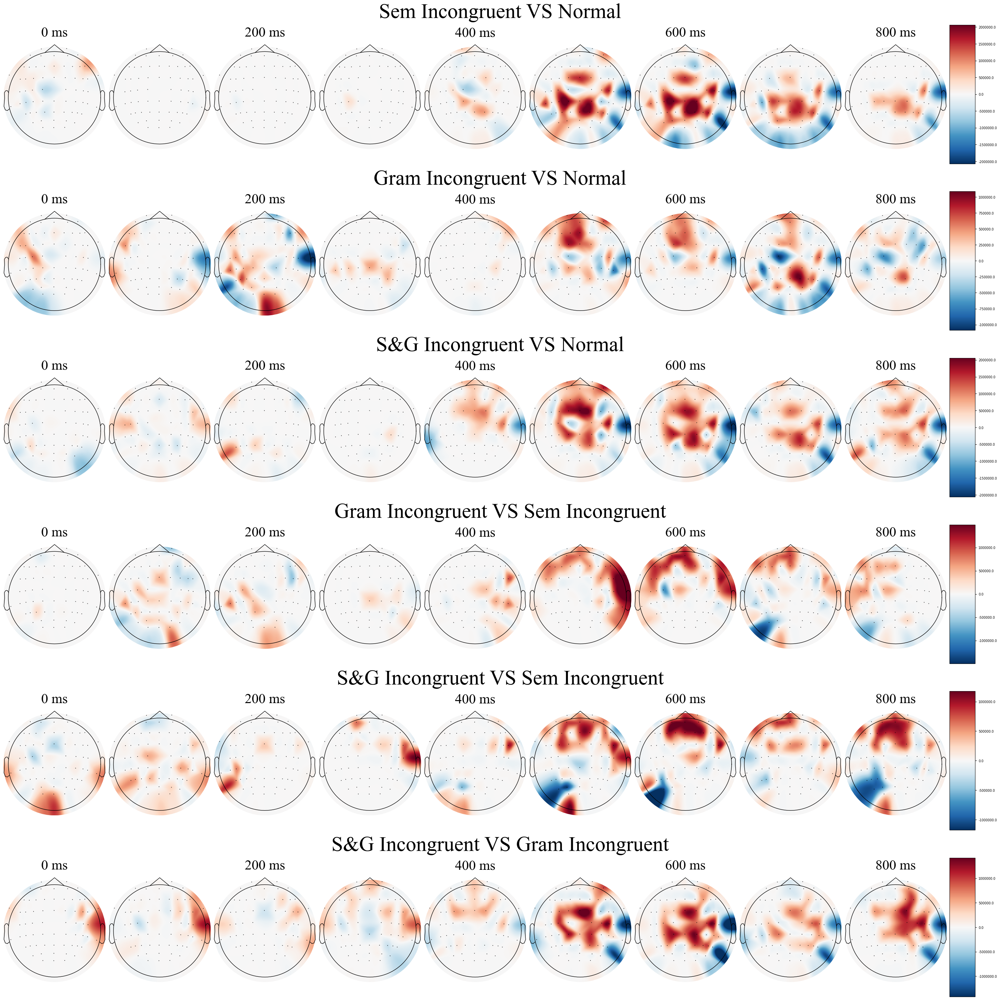

In [13]:
plot_topo(data_masked, example_data, cond_dict, os.path.join(RESULT_DIR, '4x4'), order = 'Incongr-Congr')

## Check priming effect

- Read epoched ERP data of participants

In [16]:
epochs_list = {}

for p_ID in tqdm(range(21)):
    epochs = mne.read_epochs(os.path.join(DATA_DIR, f'p{p_ID}_epochs.fif'), verbose='ERROR')
    epochs.set_eeg_reference(projection=False, verbose='ERROR')
    epochs_list[p_ID] = epochs

  0%|          | 0/21 [00:00<?, ?it/s]

- Collect first, second, third and fourth occurencies of sentences within similar groups based on individual stimuli lists

In [21]:
entries = defaultdict(list)

for p_ID in tqdm(epochs_list.keys()):
    epochs = epochs_list[p_ID]
    dropped_epochs = [len(i) > 0 for i in epochs.drop_log]
    event_data = pd.read_csv(os.path.join(DATA_DIR, '..', 'epochs_info', f'p{p_ID}_events.csv'))
    sent_counter = defaultdict(int)
    order_indexes = []
    event_data['idx_eeg'] = np.arange(event_data.shape[0])
    event_data['bad'] = dropped_epochs
    event_data_clean = event_data[event_data['bad'] == False].sort_values('idx_eeg')
    
    for item in event_data_clean.sentence_id_eeg:
        order_indexes.append(sent_counter.get(item, 0))
        sent_counter[item] += 1
    for entry in range(4):
        if entry in order_indexes:
            entries[entry].append(epochs[np.where(np.array(order_indexes) == entry)[0]])
    

  0%|          | 0/21 [00:00<?, ?it/s]

In [23]:
entry_epochs = []
for entry in tqdm(range(4)):
    my_events = np.concatenate([ep.events for ep in entries[entry]])
    my_event_id = entries[entry][0].event_id
    my_events[:, 0] = np.arange(my_events.shape[0])
    epoch_data = np.concatenate([ep.get_data() for ep in entries[entry]])
    test_epochs = mne.EpochsArray(data=epoch_data,
                                  events=my_events, 
                                  event_id=my_event_id, 
                                  info=epochs.info, baseline=(None, 0),
                                  tmin=-0.4, verbose='ERROR')
    entry_epochs.append(test_epochs)

  0%|          | 0/4 [00:00<?, ?it/s]

In [25]:
my_events = np.concatenate([ep.events for idx, ep in epochs_list.items()])
my_event_id = epochs_list[0].event_id
my_events[:, 0] = np.arange(my_events.shape[0])
epoch_data = np.concatenate([ep.get_data() for idx, ep in epochs_list.items()])
all_epochs = mne.EpochsArray(data = epoch_data,
                             events=my_events, 
                             event_id=my_event_id, 
                             info=epochs.info, baseline=(None, 0),
                             tmin=-0.4, verbose='ERROR') 

- Calculate singular vectors based on Singular Valuee Decomposition of the averaged ERP data
- Project ERP data of consecuitive occurences of similar sentence groups
- Draw plots

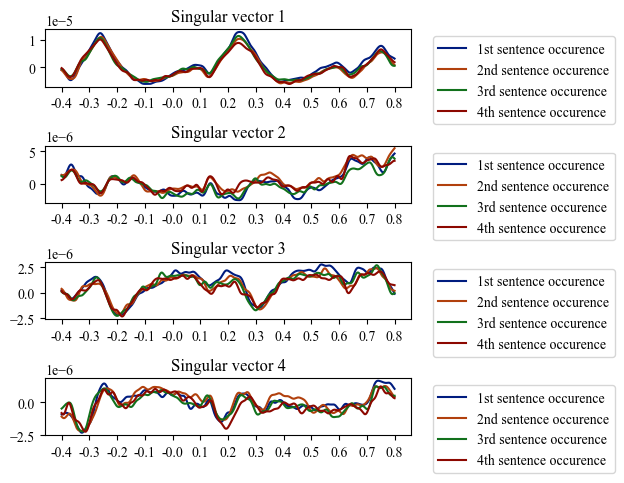

In [ ]:
plt.rcParams.update({'font.family' : 'Times New Roman', 'font.size' : 10})
sns.set_palette("dark")

X = all_epochs.average().get_data().T
U, S, Vt = np.linalg.svd(X, full_matrices=False)
X_proj_all = []

k = 4
for idx, item in enumerate(entry_epochs): 
    X_proj = item.average().get_data().T @ Vt[:k].T
    X_proj_all.append(X_proj)
X_proj_all = np.array(X_proj_all)

fig, axes = plt.subplots(k, 1)

for idx in range(k):
    axes[idx].plot(X_proj_all[:, :, idx].T)
    axes[idx].set_title(f'Singular vector {idx + 1}')
    axes[idx].set_xticks(np.arange(0, 1201, 100), labels = np.arange(-0.4, 0.801, 0.1).round(1))
    axes[idx].legend(['1st sentence occurence', '2nd sentence occurence',
                      '3rd sentence occurence', '4th sentence occurence'],
                    bbox_to_anchor=(1.04, 1), loc="upper left")
fig.tight_layout()
fig.show()
fig.savefig(os.path.join(RESULT_DIR, 'priming_effect',
                         'components_projections.png'), dpi=600)

- Compute correlations between projections

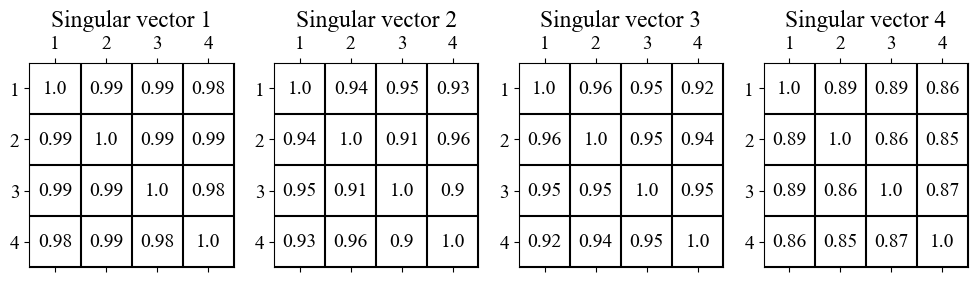

In [ ]:
from matplotlib.colors import ListedColormap
plt.rcParams.update({'font.family' : 'Times New Roman', 'font.size' : 14})
bounds = np.arange(0, 1.4, 0.02)
norm = colors.BoundaryNorm(boundaries=bounds, ncolors=256)
single_color_cmap = ListedColormap(['white'])

N_times = 4
corr_matrix = np.zeros((k, N_times, N_times))

for component in list(range(k)):
    for time1 in range(N_times):
        for time2 in list(range(time1, N_times)):
            corr_matrix[component, time1, time2] = scipy.stats.pearsonr(
                X_proj_all[time1, :, component], X_proj_all[time2, :, component])[0]
            corr_matrix[component, time2, time1] = scipy.stats.pearsonr(
                X_proj_all[time2, :, component], X_proj_all[time1, :, component])[0]

fig, axes = plt.subplots(1, 4, sharey=False, figsize = (10, 5))

for idx in range(k):
    im = axes[idx].matshow(corr_matrix[idx],
                         cmap=single_color_cmap, norm = norm)
    axes[idx].set_title(f'Singular vector {idx + 1}')
    axes[idx].set_xticks(np.arange(0, 4), labels = ['1', '2', '3', '4'],
                        rotation=0)
    axes[idx].set_yticks(np.arange(0, 4), labels = ['1', '2', '3', '4'])

    axes[idx].hlines(y=np.arange(0, 4)+0.5, xmin=np.full(4, 0)-0.5, xmax=np.full(4, 4)-0.5, color="black")
    axes[idx].vlines(x=np.arange(0, 4)+0.5, ymin=np.full(4, 0)-0.5, ymax=np.full(4, 4)-0.5, color="black")

    rows, cols = corr_matrix[idx].shape
    for r in range(rows):
        for c in range(cols):
            axes[idx].text(c, r, round(corr_matrix[idx][r, c], 2), color='black', ha='center', va='center')

fig.tight_layout()
fig.savefig(os.path.join(RESULT_DIR, 'priming_effect', 'components_projections_corr.png'), dpi=600)

## Visualization of averaged ERP between conditions

- Concatenate all epochs across participants 

No projector specified for this dataset. Please consider the method self.add_proj.


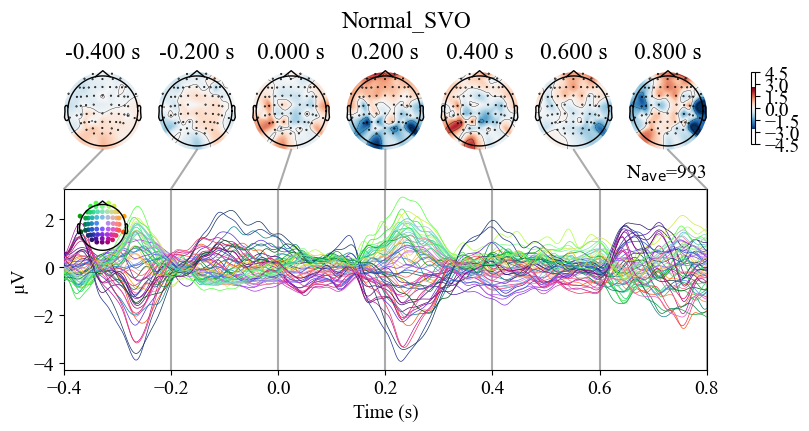

No projector specified for this dataset. Please consider the method self.add_proj.


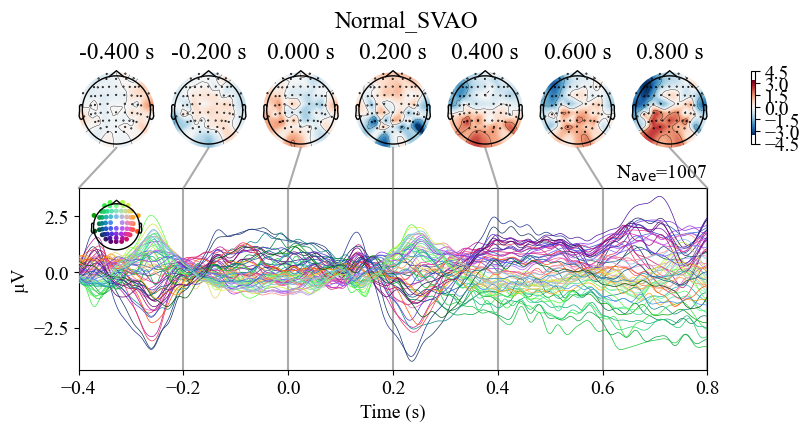

No projector specified for this dataset. Please consider the method self.add_proj.


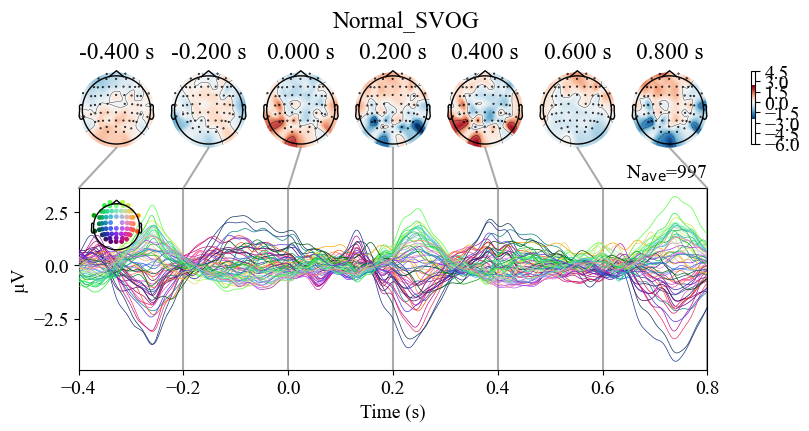

No projector specified for this dataset. Please consider the method self.add_proj.


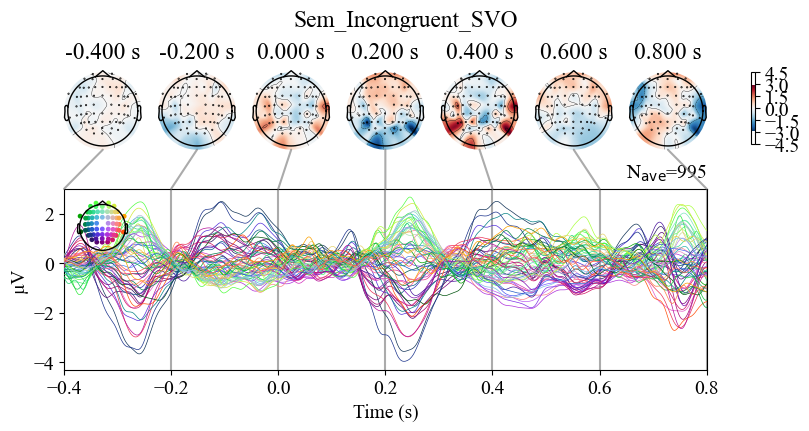

No projector specified for this dataset. Please consider the method self.add_proj.


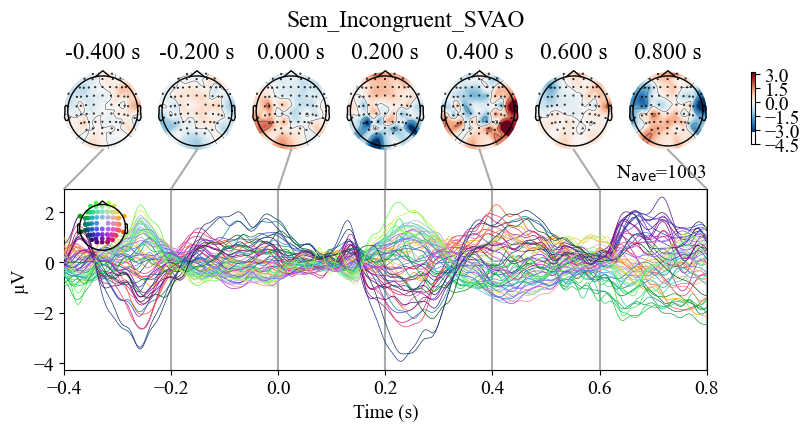

No projector specified for this dataset. Please consider the method self.add_proj.


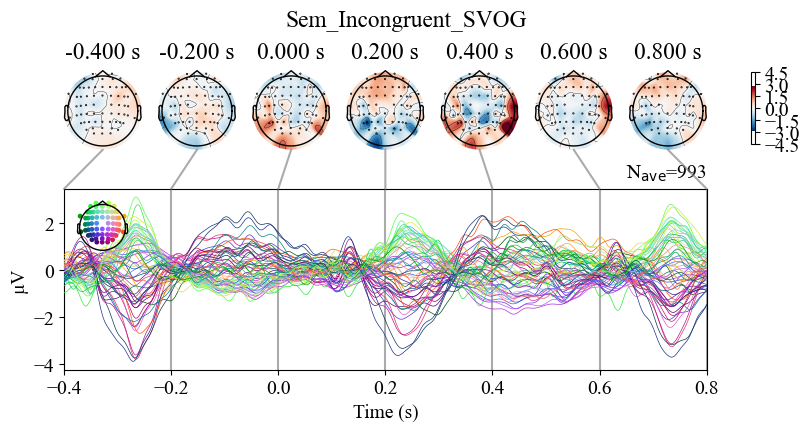

No projector specified for this dataset. Please consider the method self.add_proj.


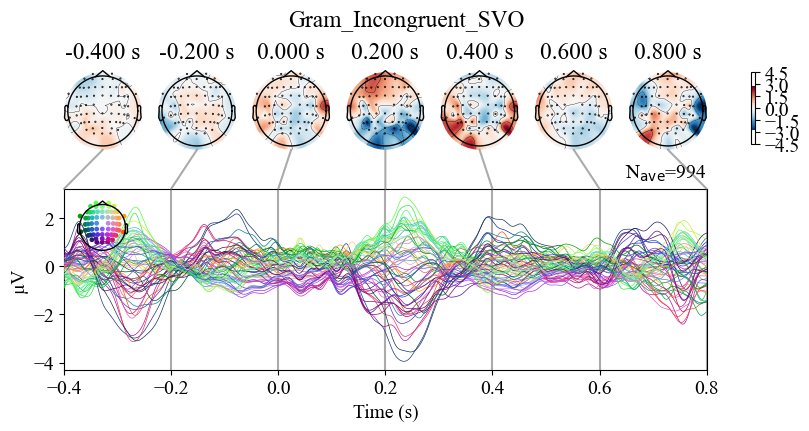

No projector specified for this dataset. Please consider the method self.add_proj.


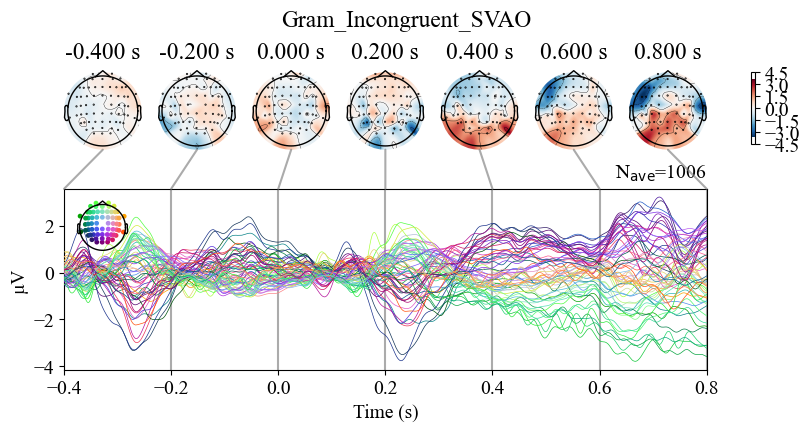

No projector specified for this dataset. Please consider the method self.add_proj.


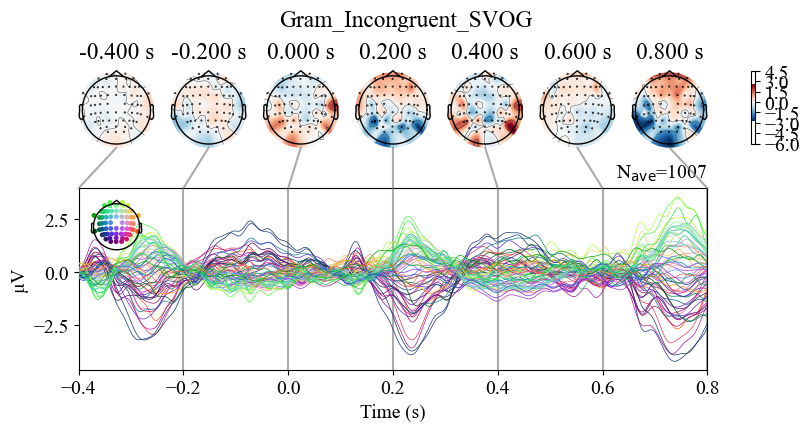

No projector specified for this dataset. Please consider the method self.add_proj.


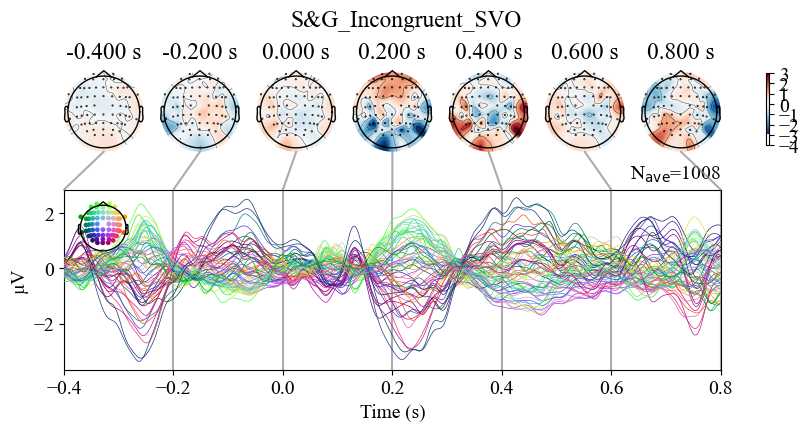

No projector specified for this dataset. Please consider the method self.add_proj.


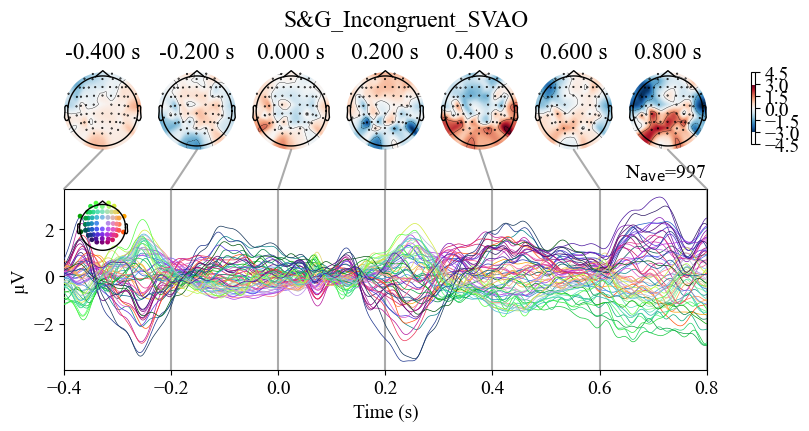

No projector specified for this dataset. Please consider the method self.add_proj.


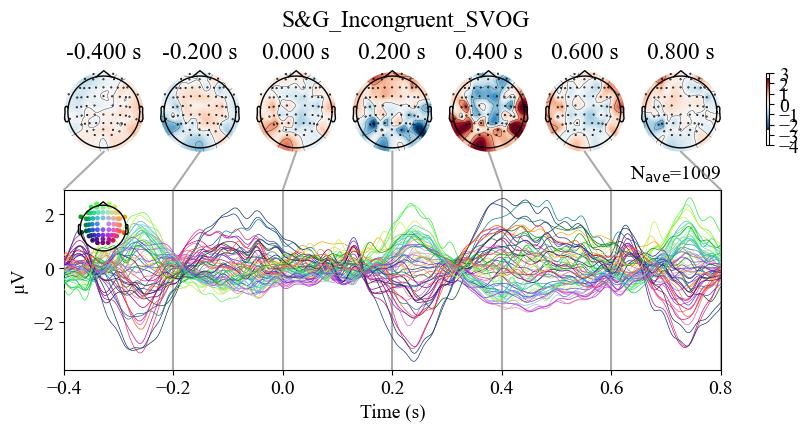

In [28]:
plt.rcParams.update({'font.family' : 'Times New Roman', 'font.size' : 14})

cond_dict = ['Normal_SVO', 'Normal_SVAO', 'Normal_SVOG',
            'Sem_Incongruent_SVO', 'Sem_Incongruent_SVAO', 'Sem_Incongruent_SVOG',
            'Gram_Incongruent_SVO', 'Gram_Incongruent_SVAO', 'Gram_Incongruent_SVOG',
            'S&G_Incongruent_SVO', 'S&G_Incongruent_SVAO', 'S&G_Incongruent_SVOG']

for cond, cond_name in zip(all_epochs.event_id, cond_dict):
    fig = all_epochs[cond].average().plot_joint(title=cond_name, times=np.arange(-0.4, 0.8, 0.2))
    fig.savefig(os.path.join(RESULT_DIR, 'ERP', f"{cond_name}.png"), dpi = 600)

In [29]:
all_epochs = mne.EpochsArray(data = epoch_data,
                             events=my_events, 
                             event_id=my_event_id, 
                             info=epochs.info, baseline=(None, 0),
                             tmin=-0.4, verbose='ERROR')
# Rename events 
all_epochs.event_id = {'Norm_SVO': 10001, 'Norm_SVAO': 10002, 'Norm_SVOG': 10003,
                       'Sem_SVO': 10004, 'Sem_SVAO': 10005, 'Sem_SVOG': 10006,
                       'Gram_SVO': 10007, 'Gram_SVAO': 10008, 'Gram_SVOG': 10009,
                       'S&G_SVO': 10010, 'S&G_SVAO': 10011, 'S&G_SVOG': 10012}

all_epochs

Number of events,12009
Events,Gram_SVAO: 1006Gram_SVO: 994Gram_SVOG: 1007Norm_SVAO: 1007Norm_SVO: 993Norm_SVOG: 997S&G_SVAO: 997S&G_SVO: 1008S&G_SVOG: 1009Sem_SVAO: 1003Sem_SVO: 995Sem_SVOG: 993
Time range,-0.400 – 0.800 s
Baseline,-0.400 – 0.000 s


- Average epochs across conditions

In [30]:
ERPs_averaged = []

for cond, cond_name in zip(all_epochs.event_id, cond_dict):
    ERPs_averaged.append(all_epochs[cond].average())

- Pick individual channels and visualize

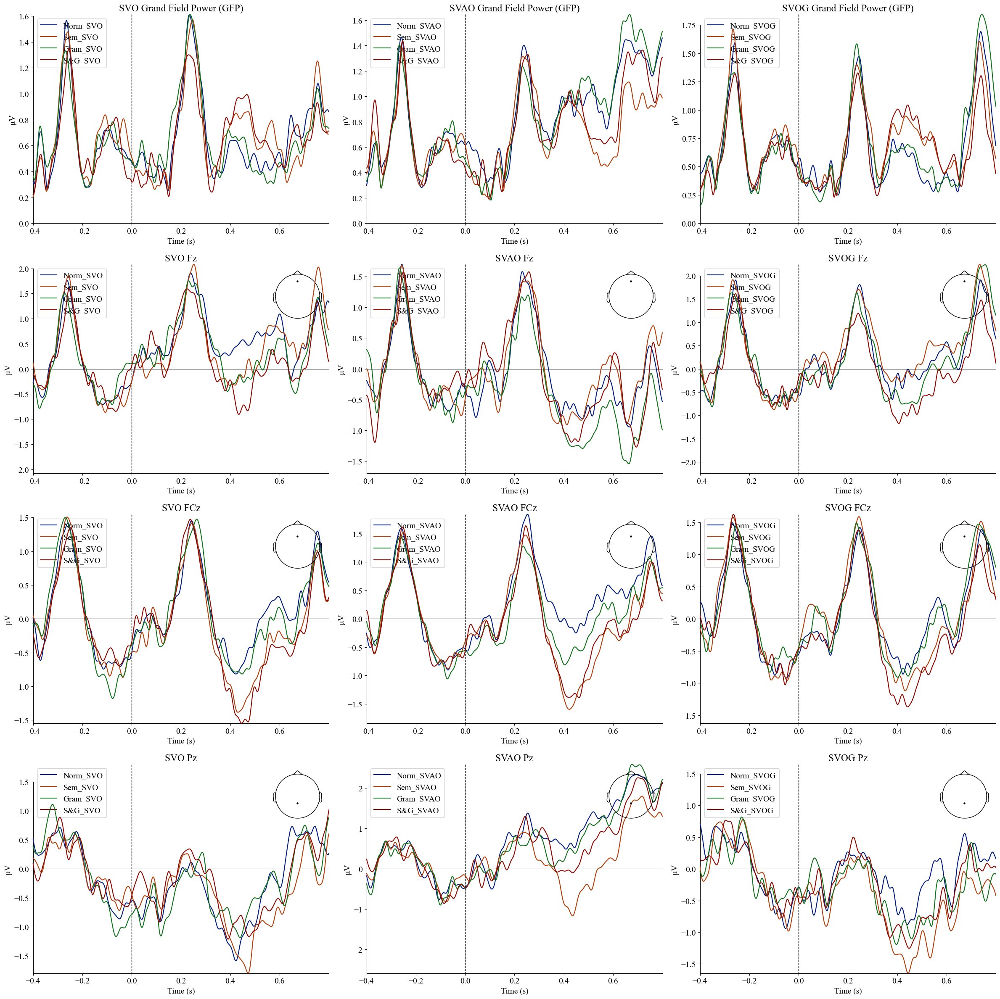

In [31]:
fig, axes = plt.subplots(4, 3, figsize=(24, 24))

for num, ch_idx in enumerate([None, 1, 38, 12]):
    for idx, name in enumerate(['SVO', 'SVAO', 'SVOG']):
        if num != 0:
            title = f'{name} {all_epochs[cond].ch_names[ch_idx]}'
            picks = [ch_idx]
        else:
            title = f'{name} Grand Field Power'
            picks = None
        with mne.use_log_level('WARNING'):
            mne.viz.plot_compare_evokeds(ERPs_averaged[idx:12:3], picks=picks, 
                                         title = title, truncate_xaxis=False, 
                                         axes=axes[num, idx], show=False)
fig.tight_layout()
plt.show()
fig.savefig(os.path.join(RESULT_DIR, 'ERP', f"ind_channels.jpg"), dpi=600)

- Visualize difference between conditions for all channels and individual channels

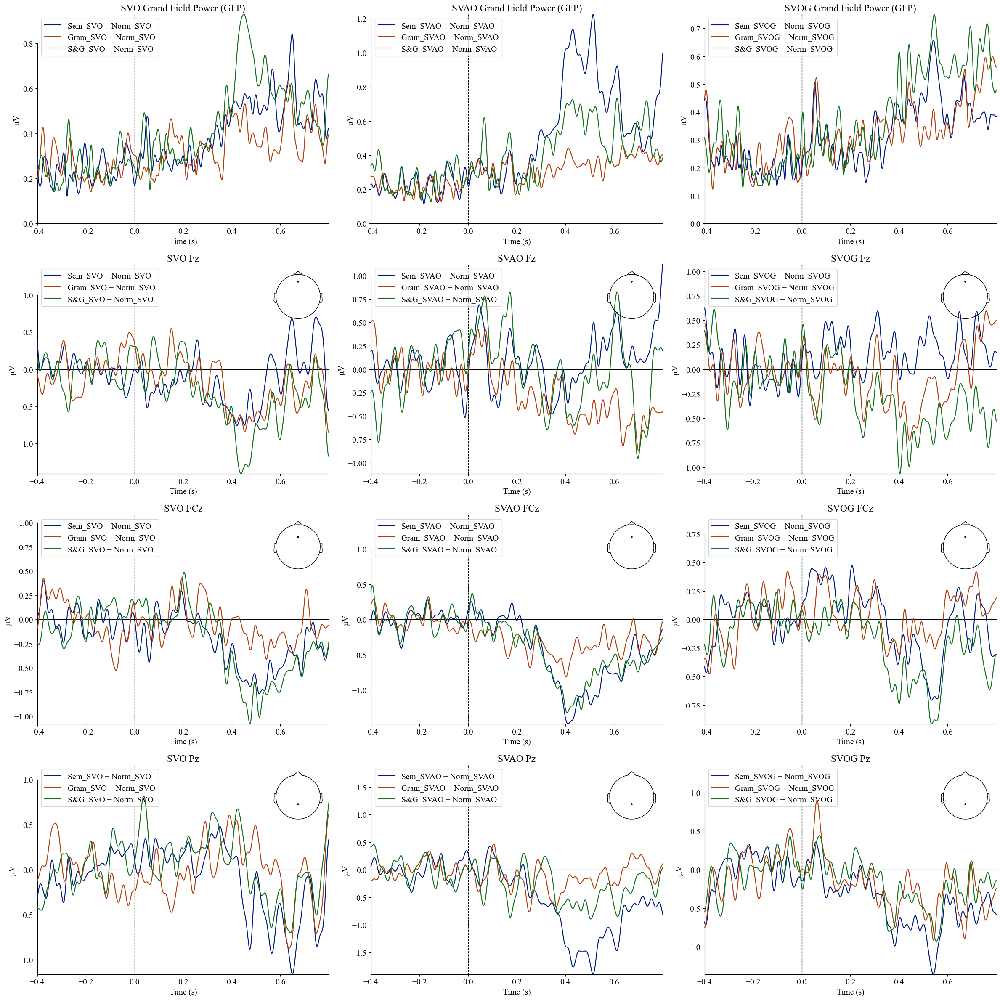

In [32]:
ERPs_averaged_diffs = []

for cond, cond_name in zip(all_epochs.event_id, cond_dict):
    if 'Norm' in cond_name:
        continue
    norm_condition_name = 'Norm_' + cond.split('_')[-1]
    diff_epoch = mne.combine_evoked(
        [all_epochs[cond].average(), all_epochs[norm_condition_name].average()], weights = [1, -1]
    )
    ERPs_averaged_diffs.append(diff_epoch)
    
fig, axes = plt.subplots(4, 3, figsize=(24, 24))

for num, ch_idx in enumerate([None, 1, 38, 12]):
    for idx, name in enumerate(['SVO', 'SVAO', 'SVOG']):
        if num != 0:
            title = f'{name} {all_epochs[cond].ch_names[ch_idx]}'
            picks = [ch_idx]
        else:
            picks = None
            title = f'{name} Grand Field Power'
        with mne.use_log_level('WARNING'):
            mne.viz.plot_compare_evokeds(ERPs_averaged_diffs[idx:9:3], picks=picks, 
                                        title=title, truncate_xaxis=False, axes=axes[num, idx], show=False)


fig.tight_layout()
plt.show()
fig.savefig(os.path.join(RESULT_DIR, 'ERP_difference', f"ind_channels_diffs.jpg"), dpi=600)

No projector specified for this dataset. Please consider the method self.add_proj.


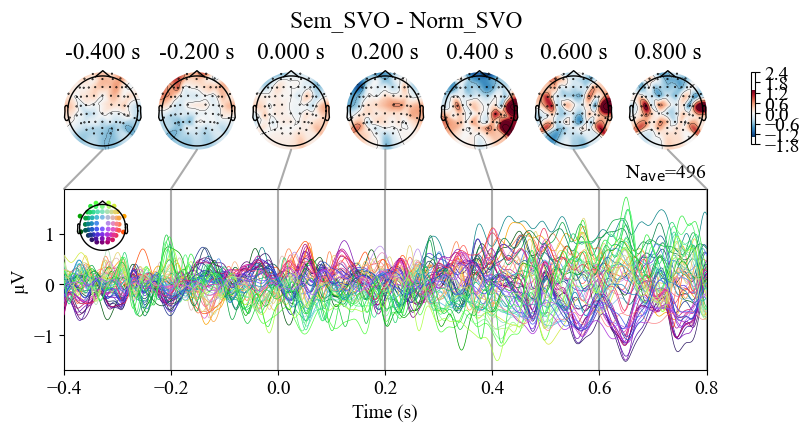

No projector specified for this dataset. Please consider the method self.add_proj.


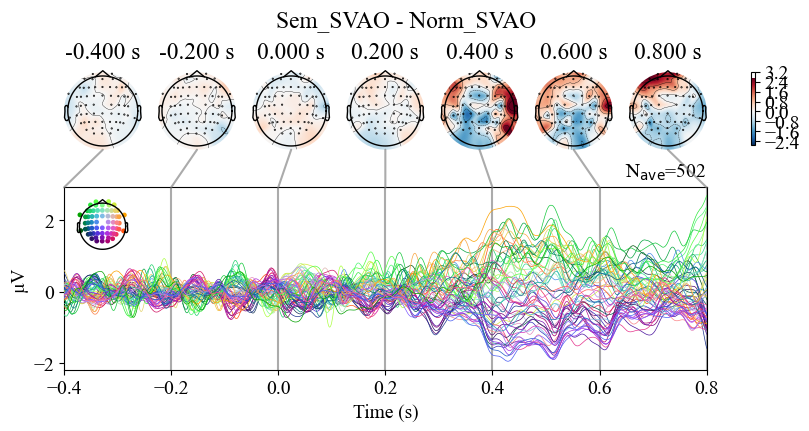

No projector specified for this dataset. Please consider the method self.add_proj.


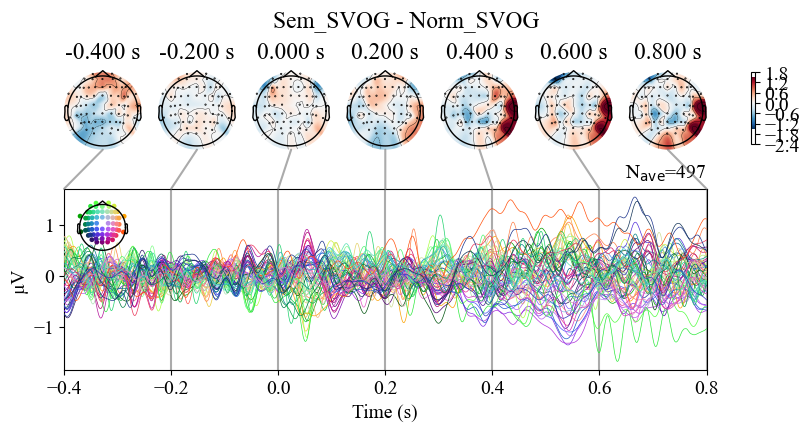

No projector specified for this dataset. Please consider the method self.add_proj.


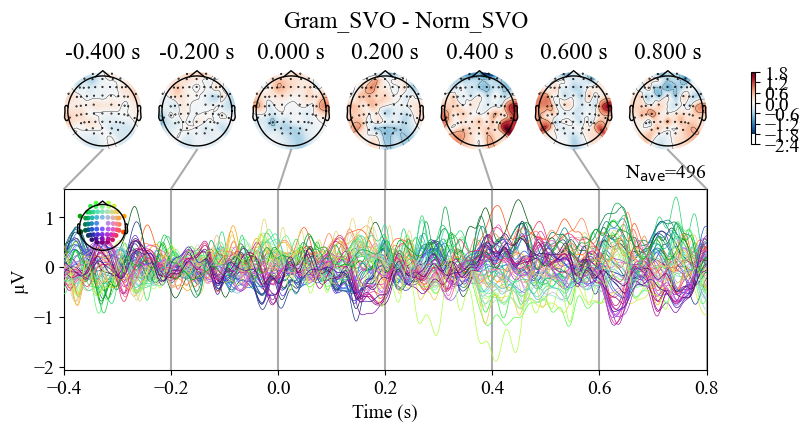

No projector specified for this dataset. Please consider the method self.add_proj.


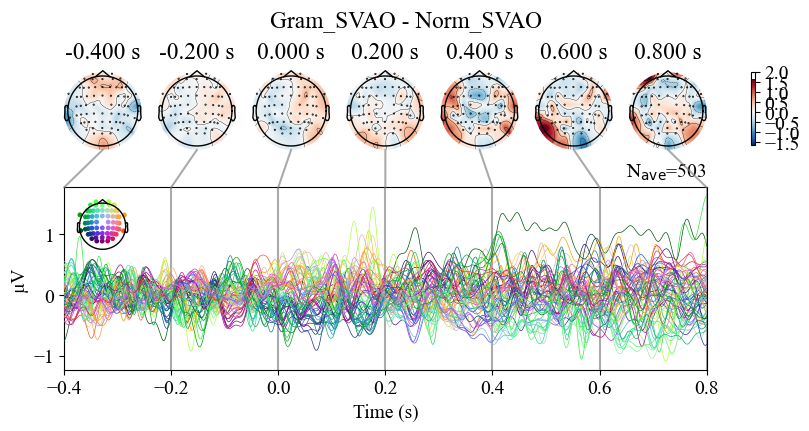

No projector specified for this dataset. Please consider the method self.add_proj.


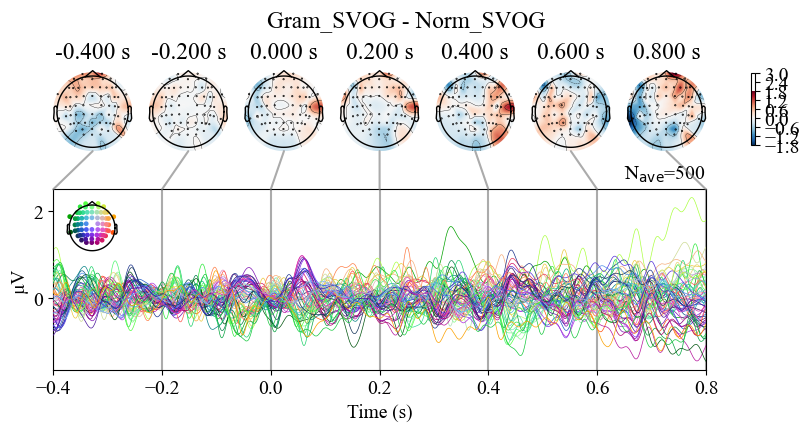

No projector specified for this dataset. Please consider the method self.add_proj.


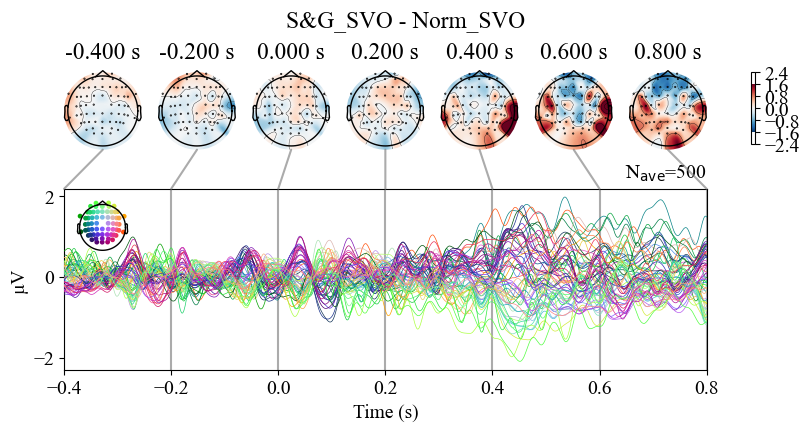

No projector specified for this dataset. Please consider the method self.add_proj.


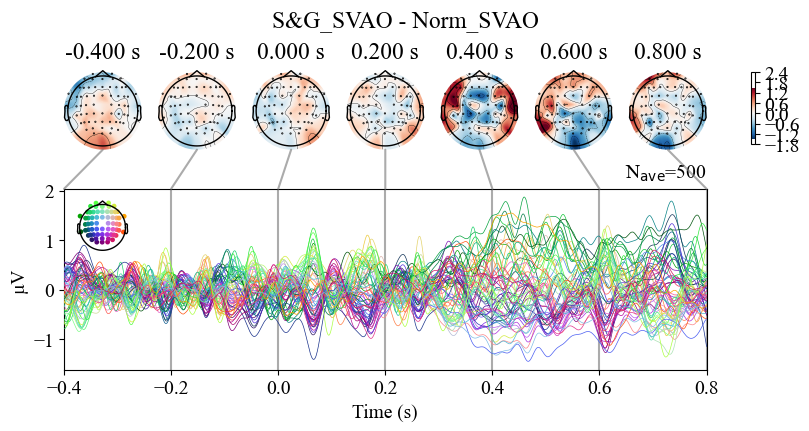

No projector specified for this dataset. Please consider the method self.add_proj.


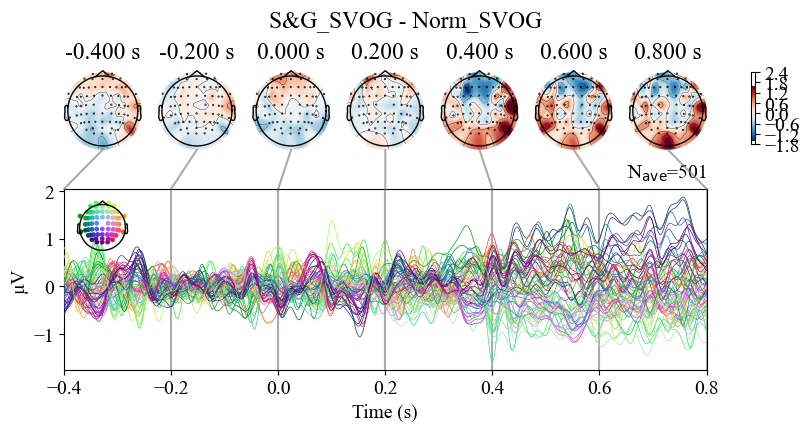

In [33]:
titles = [item.comment for item in ERPs_averaged_diffs]

for idx, cond_name in enumerate(titles):
    fig = ERPs_averaged_diffs[idx].plot_joint(title=cond_name, times=np.arange(-0.4, 0.8, 0.2))
    fig.savefig(os.path.join(RESULT_DIR, 'ERP_difference', f"{cond_name}.png"), dpi = 600)